Simulation of a passive circle inmersed in a bath of bacteria with a velocity gradient along the simulation box.

The interactions between the cells and the passive circle assume that, when colliding, the cells push the circle with the drag force $F=\gamma v$, where $\gamma_i=6\pi\eta R_i$ is the drag coefficient and $\eta=10^{-3}$Pa·s is the viscosity of the medium (water).

A few of things to note:
- I assume the passive circle does not present Brownian motion
- The interactions do not work in the boundaries (PBC are not applied to interactions)
- I assume that $\gamma_{bacteria}+\gamma_{circle} \approx \gamma_{circle}$ ($\gamma_{circle}>>\gamma_{bacteria}$)

In [6]:
from pylab import *
from scipy.optimize import curve_fit
%matplotlib inline
warnings.filterwarnings("ignore")

## Input parameters:

In [16]:
#BACTERIA:
N = 1000
lam = 1. #s^-1
Rb=0.5 #um

#BOX (Square simulation box)
L = 70 #um 

#viscosity (of water)
eta=0.001 #Pa*s

# Time step in seconds
dt = 0.1 #s

#Passive circle
R=10. #um

#drag coefficients:
gamma_circle=6*pi*eta*R
gamma_bacteria=6*pi*eta*Rb
ratio_gamma=gamma_bacteria/gamma_circle


#Light gradient along the box
uleft=0. #mW/mm2
uright=3. #mW/mm2
ugrad=(uright-uleft)/L

#parameters for the light dependent intensity
vmax=10.#um/s
k=2.5
vi=1. #um/s

## Classes and methods

In [17]:
class Bacteria:

    def __init__(self, N, lam):
        self.N = N
        self.lam = lam
        self.pos = zeros((2,N))
        self.theta = random(N)*2*pi
        self.dir = array([cos(self.theta), sin(self.theta)])


    def distribute(self, L):
        self.pos = random((2,N))*L
    
    #to distribute cells and leave an empty circle of radius R in the middle:
    def distribute_emptycircle(self, L, R):
        self.pos = random((2,N))*L

        dx=self.pos[0]-L/2
        dy=self.pos[1]-L/2
        d_r=sqrt(dx*dx+dy*dy)
        
        cond1 = d_r<(R/2)
        ninside1 = count_nonzero(cond1)
        cond2=(d_r<R)*(d_r>(R/2))
        ninside2=count_nonzero(cond2)
        
        self.pos[0,cond1]=random(ninside1)*(L/2-R)
        self.pos[1,cond1]=random(ninside1)*(L)        
        self.pos[0,cond2]=random(ninside2)*(L/2-R)+L/2+R
        self.pos[1,cond2]=random(ninside2)*(L)
        
    def evolve(self, dt, cells_v, cells_dir):
        self.dir=cells_dir
        self.v=cells_v
        self.pos += dt*(self.v*self.dir)

        self.tumble(dt)
        self.boundary(L)
        
        
    def tumble(self, dt):
        r = random(self.N)
        cond = r<self.lam*dt
        ntumbles = count_nonzero(cond)
        theta = random(ntumbles)*2*pi
        self.theta[cond] = theta
        self.dir[:,cond] = array([cos(theta), sin(theta)])
        
    # PBC    
    def boundary(self, L):
        self.pos[self.pos>L]-=L
        self.pos[self.pos<0]+=L

class Passive:

    def __init__(self, R):
        self.R = R
        self.pos = zeros((2))
        self.dir = zeros((2))
        self.v=0.

    def distribute(self, L):
        self.pos = random((2))*L
    
    def center(self, L):
        self.pos =  ones((2))*L/2
        
        
    def evolve(self, dt, circle_v, circle_dir):
        self.v=circle_v
        self.dir=circle_dir.T
        self.pos += dt*self.v*self.dir
        self.boundary(L)

    # PBC    
    def boundary(self, L):
        self.pos[self.pos>L]-=L
        self.pos[self.pos<0]+=L
        
        
def vprofile(pos,ugrad):
    u=uleft+pos[0]*ugrad
    v=(vmax-vi)*u/(k+u)+vi
    return(v)



def interaction(cells,circle,fix):
    
    #Velocity gradient according to the bacteria positions:
    vold=vprofile(cells.pos,ugrad)
    
    cells_v=vold
    v_x_old=vold*cells.dir[0]
    v_y_old=vold*cells.dir[1]
    cells_dirx=cells.dir[0]
    cells_diry=cells.dir[1]

    # distance:
    drx=cells.pos[0]-circle.pos[0]
    dry=cells.pos[1]-circle.pos[1]
    dr=sqrt(drx*drx+dry*dry)
    
    # which bacteria are TOUCHING the circle?-----------------------------------------------------------
    dR=dt*vprofile(circle.pos+R+Rb,ugrad)+circle.v*dt
    cutoff=R+Rb+dR
    contact=zeros(N,dtype=bool)
    contact[(dr<=cutoff)*((R-Rb)<dr)]=True
        
    
    # which bacteria are PUSHING the circle?------------------------------------------------------------
    push=zeros(N,dtype=bool)
    #vector that goes from the cell to the circle:
    v_csx=zeros(N)
    v_csy=zeros(N)
    v_csx=-cells.pos[0]+circle.pos[0]
    v_csy=-cells.pos[1]+circle.pos[1]

    #scalar product to see if the particle is getting closer or farther from the circle
    scalarproduct=zeros(N)
    scalarproduct=v_csx*cells.dir[0]+v_csy*cells.dir[1]
    push[scalarproduct>0]=True
    
        
    # which bacteria are PUSHED by the circle?------------------------------------------------------------
    push2=zeros(N,dtype=bool)
    #vector that goes from the circle to the cell:
    v_scx=zeros(N)
    v_scy=zeros(N)
    v_scx=cells.pos[0]-circle.pos[0]
    v_scy=cells.pos[1]-circle.pos[1]

    #scalar product to see if the circle is getting closer or farther from the particle
    scalarproduct2=zeros(N)
    scalarproduct2=v_scx*circle.dir[0]+v_scy*circle.dir[1]
    push2[scalarproduct2>0]=True
    
    #The next array is true for all the cells "attached" to the circle
    #(both in the back and in the front)
    ncells_s=contact*push + contact*push2

    circle_v=zeros((2,1))
    circle_dir=zeros((2,1))
    
    #The new velocities for the circle and the cells touching the circle-------------------------
    # we sum the velocity components of the cells that are touching and pushing the circle
    # (we do not add the velocities of the cells in front of the circle, being pushed by it (contact*push2))
    vx_new=sum(v_x_old[contact*push])*ratio_gamma
    vy_new=sum(v_y_old[contact*push])*ratio_gamma
    
    #the new velocity modulus and direction:
    #(the variable fix gives the possibility to fix the position of the circle)
    new_v = 0. if fix==True else (sqrt((vx_new*vx_new)+(vy_new*vy_new)))
    new_dir=array([0.,0.]) if fix==True else [vx_new,vy_new]/new_v
    
    circle_v=new_v
    circle_dir=new_dir
    circle_dir[isnan(circle_dir)] = 0
    
    cells_v[contact*push + contact*push2]=new_v
    cells_dirx[contact*push + contact*push2]=new_dir[0]
    cells_diry[contact*push + contact*push2]=new_dir[1]
    cells_dir=array([cells_dirx,cells_diry])

    
    return circle_v,circle_dir,cells_v,cells_dir,ncells_s,contact,push,push2


### Plot the velocity gradient along the box:

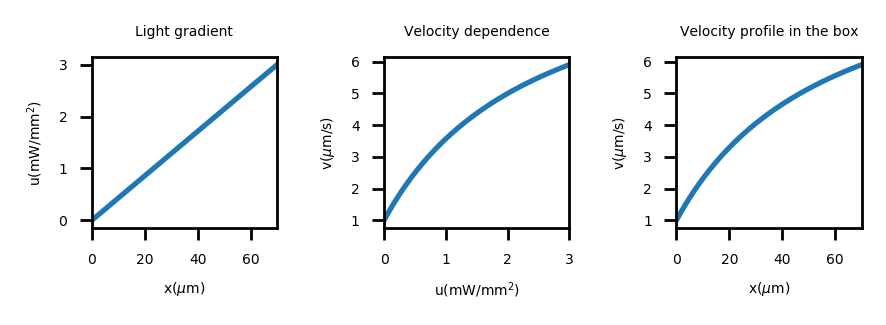

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(3.7,1.4),dpi=250)



posp=zeros((2,N))
posp[0] = linspace(0,L,N)
posp[1] = L/2

mysize=4
axes[2].set_title('Velocity profile in the box',fontsize=mysize)
axes[2].set_xlabel('x($\mu$m)',fontsize=mysize)
axes[2].set_ylabel('v($\mu$m/s)',fontsize=mysize)
axes[2].tick_params(labelsize=mysize)
axes[2].set_xlim(right=L,left=0)

vii=vprofile(posp,ugrad)
axes[2].plot(posp[0],vii)


us = linspace(uleft,uright,10000)
vs=(vmax-vi)*us/(k+us)+vi


axes[1].set_title('Velocity dependence',fontsize=mysize)
axes[1].set_xlabel('u(mW/mm$^2$)',fontsize=mysize)
axes[1].set_ylabel('v($\mu$m/s)',fontsize=mysize)
axes[1].tick_params(labelsize=mysize)
axes[1].set_xlim(right=uright,left=uleft)
axes[1].plot(us,vs)



axes[0].set_title('Light gradient',fontsize=mysize)
axes[0].set_xlabel('x($\mu$m)',fontsize=mysize)
axes[0].set_ylabel('u(mW/mm$^2$)',fontsize=mysize)
axes[0].tick_params(labelsize=mysize)
axes[0].set_xlim(right=L,left=0)

pp=linspace(0,L,N)
uu=uleft+pp*ugrad

axes[0].plot(pp,uu)


fig.tight_layout()

plt.show()

# Simulation:

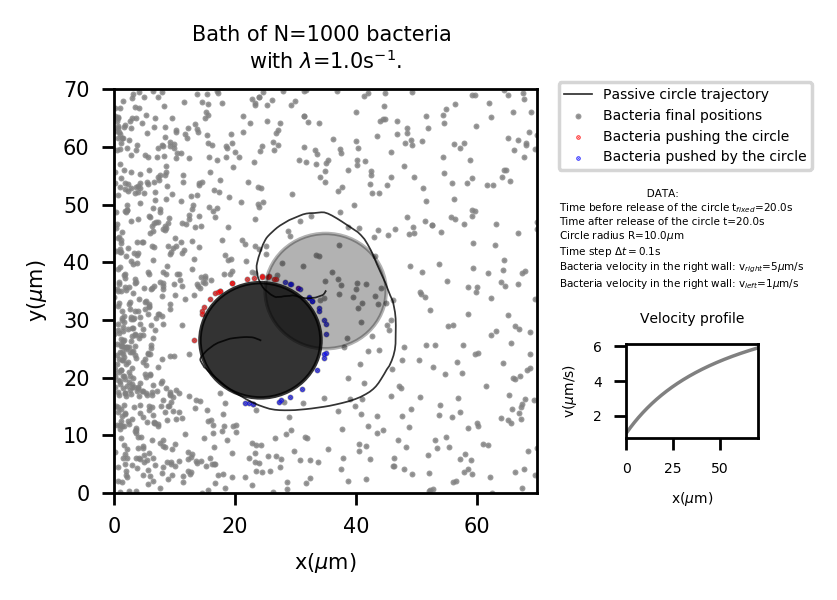

In [25]:
cells = Bacteria(N, lam)
#cells.distribute(L)
cells.distribute_emptycircle(L,R)

circle2d = Passive(R)
#circle2d.distribute(L)
circle2d.center(L)

#Total steps:
steps = 400
#Steps before releasing the circle:
steps_fixed=200


#-------------------------------------------------------------------------------
# plot
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(3.5,2.5),dpi=250)
mysize=6
xlim(right=L,left=0)
ylim(top=L,bottom=0)
axes.set_xlabel('x($\mu$m)',fontsize=mysize)
axes.set_ylabel('y($\mu$m)',fontsize=mysize)
axes.set_title('Bath of N=' + str(N) + ' bacteria \n'
               'with $\lambda$=' + str(lam) + 's$^{-1}$.'
               ,fontsize=mysize)

#-------------------------------------------------------------------------------
circle = Circle((circle2d.pos[0],circle2d.pos[1]), radius=R,color='black', alpha=0.3)
axes.add_patch(circle)


results_sx=zeros((steps))
results_sy=zeros((steps))
results_cx=np.zeros([steps,N])
results_cy=np.zeros([steps,N])

results_cx_t=np.zeros([steps,N])
results_cy_t=np.zeros([steps,N])

results_cx_cont=np.zeros([steps,N])
results_cy_cont=np.zeros([steps,N])

results_cx_push=np.zeros([steps,N])
results_cy_push=np.zeros([steps,N])

results_cx_push2=np.zeros([steps,N])
results_cy_push2=np.zeros([steps,N])

fix=True

for i in range(steps):
    #print(i)
    if i>steps_fixed: fix=False
    
    circle2d_v,circle2d_dir,cells_v,cells_dir,ncells_s,contact,push,push2=interaction(cells,circle2d,fix)
    circle2d.evolve(dt,circle2d_v,circle2d_dir)
    cells.evolve(dt,cells_v,cells_dir)

    
    # we save the results to animate later
    results_cx[i,:]=cells.pos[0]
    results_cy[i,:]=cells.pos[1]
    results_cx_t[i,ncells_s]=cells.pos[0,ncells_s]
    results_cy_t[i,ncells_s]=cells.pos[1,ncells_s]
    
    results_cx_cont[i,contact]=cells.pos[0,contact]
    results_cy_cont[i,contact]=cells.pos[1,contact]
    
    results_cx_push[i,push]=cells.pos[0,push]
    results_cy_push[i,push]=cells.pos[1,push]
    
    results_cx_push2[i,push2]=cells.pos[0,push2]
    results_cy_push2[i,push2]=cells.pos[1,push2]
    
    results_sx[i]=circle2d.pos[0]
    results_sy[i]=circle2d.pos[1]
    
    #print (i, end="\r")
    
    
plot(results_sx,results_sy,color='black',linewidth=0.5,alpha=0.8,label='Passive circle trajectory')
scatter(cells.pos[0],cells.pos[1],s=0.5,color='grey',alpha=0.8,label='Bacteria final positions' )
scatter(cells.pos[0,contact*push],cells.pos[1,contact*push],s=0.1,color='red',alpha=0.8,label='Bacteria pushing the circle' )
scatter(cells.pos[0,contact*push2],cells.pos[1,contact*push2],s=0.1,color='blue',alpha=0.8,label='Bacteria pushed by the circle' )


circle = Circle((circle2d.pos[0],circle2d.pos[1]), radius=R,color='black', alpha=0.8)
axes.add_patch(circle)

axes.text(1.05, 0.5, '                           DATA: \n'
          'Time before release of the circle t$_{fixed}$='+ str(steps_fixed*dt) + 's \n'
          'Time after release of the circle t='+ str((steps-steps_fixed)*dt) + 's \n'
          'Circle radius R='+ str(R) + '$\mu$m \n'
          'Time step $\Delta t=$' + str(dt) + 's \n'
          'Bacteria velocity in the right wall: v$_{right}$=' + str(int((vmax-vi)*uright/(k+uright)+vi)) + '$\mu$m/s \n'
          'Bacteria velocity in the right wall: v$_{left}$=' + str(int((vmax-vi)*uleft/(k+uleft)+vi)) + '$\mu$m/s',
        verticalalignment='bottom', horizontalalignment='left',
        transform=axes.transAxes, fontsize=mysize-3)


axes.tick_params(labelsize=mysize)
legend(fontsize=mysize-2,loc=(1.05,0.8))


# These are in unitless percentages of the figure size. (0,0 is bottom left)
left, bottom, width, height = [0.73, 0.28, 0.15, 0.15]
ax2 = fig.add_axes([left, bottom, width, height])

ax2.set_title('Velocity profile',fontsize=mysize-2)
ax2.set_xlabel('x($\mu$m)',fontsize=mysize-2)
ax2.set_ylabel('v($\mu$m/s)',fontsize=mysize-2)
ax2.tick_params(labelsize=mysize-2)
ax2.set_xlim(right=L,left=0)

ax2.plot(posp[0],vii,linewidth=1,color='grey')



fig.tight_layout()

plt.savefig('/Users/work/Desktop/Passive_bathgradientt.pdf')


## To make a video:

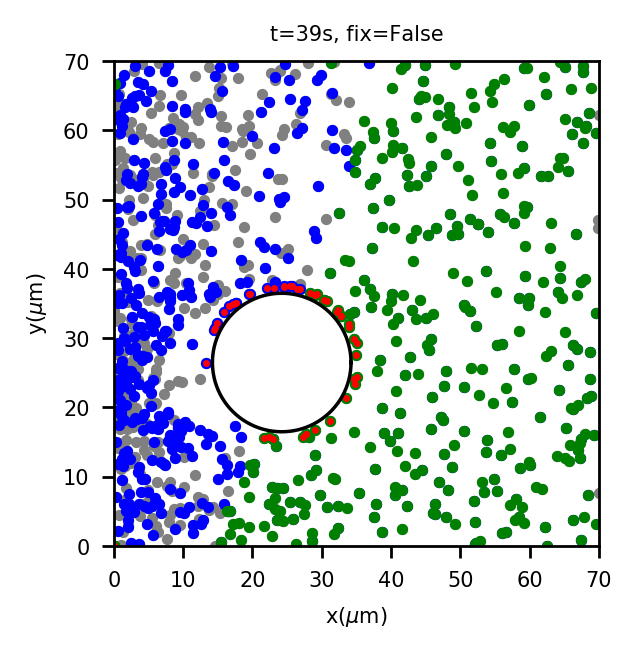

In [26]:
from matplotlib import animation
from IPython.display import HTML

fr_ps=np.int(1./dt)



#interval between animated frames:
df=1

# Speed up the video:
speed=1./df #/10.

fig = plt.figure(figsize=(2.65,2.6),dpi=250)
ax = plt.axes(xlim=(0, L), ylim=(0, L)) 
scat = ax.scatter([], [], s=5, color='gray')
scatpush = ax.scatter([], [], s=5, color='blue')
scatpush2 = ax.scatter([], [], s=5, color='green')

scatcont = ax.scatter([], [], s=1, color='red')



line, = ax.plot([], [], lw=1, color='black') 

#plt.title( 'Particles with $v_0$=' + str(v0) + ' $\mu$m/s, a probability of tumbling \n'
#            '$P_t=$' + str(p_s) + ' $s^{-1}$ (video speed ' + str(speed) + 'x)', fontsize=mysize)            
plt.xlabel('x($\mu$m)',fontsize=mysize)
plt.ylabel('y($\mu$m)',fontsize=mysize)
ax.tick_params(labelsize=mysize)
fig.tight_layout()


def init(): 
    # creating an empty plot/frame 
    line.set_data([], []) 
    return line, 

transp_cellsxy=np.transpose([results_cx, results_cy])
transp_circle2dxy=np.transpose([results_sx, results_sy])


transp_cellsxy_push=np.transpose([results_cx_push, results_cy_push])

transp_cellsxy_push2=np.transpose([results_cx_push2, results_cy_push2])

transp_cellsxy_cont=np.transpose([results_cx_cont, results_cy_cont])


fixan=True




# animation function 
def animate(i): 
    
    
    fixan = True if (i*df)<steps_fixed else False 

    
    scat.set_offsets(transp_cellsxy[:,i*df])
    scatpush.set_offsets(transp_cellsxy_push[:,i*df])
    scatpush2.set_offsets(transp_cellsxy_push2[:,i*df])
    scatcont.set_offsets(transp_cellsxy_cont[:,i*df])

    theta = np.linspace(0, 2*pi, 100)
    r=R
    x=results_sx[i*df]+r*cos(theta)
    y=results_sy[i*df]+r*sin(theta)

    
    line.set_data(x, y)
    ax.set_title('t=' + str(int((i*df)*dt)) + 's, fix=' + str(fixan),fontsize=mysize)
    

    
    print (i, end="\r")


    return scat, scatpush, scatpush2, scatcont, line,
    
anim = animation.FuncAnimation(fig, animate, init_func=init, 
                        frames=int(steps/df), interval=100/speed, blit=True) 

HTML(anim.to_html5_video())

In [27]:
anim.save('Passive_bath_gradient_testbig.mp4', writer = 'ffmpeg')#, fps = speed*fr_ps) 